# <center>Classification of birds species based on bones using machine learning approach</center>

### &rarr; Data Description
#### This Bird's dataset have six classes and have various ecological groupings based on their habitats and dietary preferences. In this project, we will be dealing with 6 ecological bird groups and each bird has been labelled by its ecological group.

- Swimming Birds (labelled as: SW)
- Wading Birds (labelled as: W)
- Terrestrial Birds (labelled as: T)
- Raptors (labelled as: R)
- Scansorial Birds (labelled as: P)
- Singing Birds (labelled as: SO)


#### This dataset have 420 records having different bird species. For the representation of each bird there are 10 measurements which are listed below.

- Length and Diameter of Humerus
- Length and Diameter of Ulna
- Length and Diameter of Femur
- Length and Diameter of Tibiotarsus
- Length and Diameter of Tarsometatarsus

#### The type of all measurements are continuous float values (mm), and empty strings are used to represent any missing values. This dataset contains bones from the Natural History Museum of Los Angeles County. They are members of 153 genera, 21 orders, and 245 species.


### &rarr; Machine Learning ALgorithms

#### In this project, five different algorithms has been implemented for the classification of birds species. 

- SGD Classifier
- Random Forest
- Gradient Boosted Classifier
- Ada Boosting Classifier
- KNN (K-Nearest Neighbour)

#### In our dataset we have six classes of birds in the target variable, means it's a multi-class problem. Five different machine learning classifiers has been chosen which can deal with multi-class problem. 

#### The purpose of using five algorithms is to determine which algorithm yields the best results. To find the best hyperparameters for each algorithm, "GridSearchCV" has been used.

## <ins>Following are the required python libraries or packages for the classification<ins>

In [1]:
################ Exploratory Data Analysis and Pre-processing #################

import pandas as pd # For data manipulation and analysis
import numpy as np # To perform high level mathematical operations
import matplotlib.pyplot as plt # For animated and interactive visualisations
import seaborn as sns # For visualisations of data
from tabulate import tabulate # To create table
import warnings # To ignore unsual warnings from some functions

# The main objective of pandas-profiling is to give a one-line Exploratory Data Analysis (EDA) experience in a reliable and quick solution.
from pandas_profiling import ProfileReport

from imblearn.over_sampling import RandomOverSampler #To generate new samples in the classes which are under-represented.

################ Conversion ################
# The sklearn. preprocessing package provides several common utility functions and transformer classes 
# to change raw feature vectors into a representation that is more suitable for the downstream estimators. 
from sklearn.preprocessing import LabelEncoder # Encode target labels with value between 0 and n_classes-1
from sklearn.preprocessing import StandardScaler # To standardise the dataset 
from sklearn.preprocessing import MinMaxScaler # To normalise the dataset
from sklearn.preprocessing import LabelBinarizer # Binarize labels in a one-vs-all fashion

################ Model Selection and Model Training #################

# Model_selection is a method for setting a blueprint to analyze data and then 
# use it to measure new data
from sklearn.model_selection import train_test_split # Split arrays or matrices into random train and test subsets.

################ Hyperparameter Tuning ################
from sklearn.model_selection import GridSearchCV #To find the optimal parameter values for models

################ Algorithms ################
from sklearn.ensemble import RandomForestClassifier # An ensemble tree-based mutli-class classification algorithm
from sklearn.tree import DecisionTreeClassifier # Used to set the base hyperparameters for AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier # Multi-class classification algorithm
from sklearn.ensemble import GradientBoostingClassifier # Multi-class classification algorithm
from sklearn.neighbors import KNeighborsClassifier # Multi-class classification algorithm
from sklearn.linear_model import SGDClassifier # Multi-class classification algorithm


################ Metrics and Scoring #################

from sklearn.metrics import classification_report # Build a text report showing the main classification metrics
from sklearn.metrics import accuracy_score, f1_score # To check accuracy and F1 score of the models
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve

################ Loss Function ####################
from sklearn.metrics import log_loss # To calculate loss of each model


## <ins>Read dataset (in csv format) from the directory</ins>

In [2]:
birdsDataset = pd.read_csv('./bird.csv') # Load dataset and assign it to the "birdsDataset" variable

## <ins>Exploratory Data Analysis (EDA)</ins>

#### Dataframe info() method gives the precise summary of dataset. 

In [3]:
 birdsDataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      420 non-null    int64  
 1   huml    419 non-null    float64
 2   humw    419 non-null    float64
 3   ulnal   417 non-null    float64
 4   ulnaw   418 non-null    float64
 5   feml    418 non-null    float64
 6   femw    419 non-null    float64
 7   tibl    418 non-null    float64
 8   tibw    419 non-null    float64
 9   tarl    419 non-null    float64
 10  tarw    419 non-null    float64
 11  type    420 non-null    object 
dtypes: float64(10), int64(1), object(1)
memory usage: 39.5+ KB


#### From above we can see, there is a list of columns/features of the dataset, with their number of occurrences and data types. All the variables are numeric other than the "type" which is an object, having 6 ecological groups.

 --------------------------------------------------------------------------------------------------------

In [4]:
birdsDataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,420.0,209.500000,121.387808,0.00,104.7500,209.500,314.250,419.00
huml,419.0,64.650501,53.834549,9.85,25.1700,44.180,90.310,420.00
humw,419.0,4.370573,2.854617,1.14,2.1900,3.500,5.810,17.84
ulnal,417.0,69.115372,58.784775,14.09,28.0500,43.710,97.520,422.00
ulnaw,418.0,3.597249,2.186747,1.00,1.8700,2.945,4.770,12.00
feml,418.0,36.872416,19.979082,11.83,21.2975,31.130,47.120,117.07
femw,419.0,3.220883,2.023581,0.93,1.7150,2.520,4.135,11.64
tibl,418.0,64.662823,37.838145,5.50,36.4175,52.120,82.870,240.00
tibw,419.0,3.182339,2.080827,0.87,1.5650,2.490,4.255,11.03
tarl,419.0,39.229976,23.184313,7.77,23.0350,31.740,50.250,175.00


#### The DataFrame's data are described by the describe() method. The currrent dataFrame contains numerical data, so the description contains following information for each column
- count
- mean
- std (standard deviation)
- min
- max
- 25%, 50%, 75% percentile*


--------------------------------------------------------------------------------------------------------

In [5]:
birdsDataset.shape

(420, 12)

#### Shape method gives the total number of rows and columns in the dataset. Here we can see that there are 420 rows and 12 columns

---------------------------------------------------------------------------------------------------------

 #### Dataframe head method is used to check the first five rows of the dataset. We can also pass values inside head function if we want to see more number of records or rows. From below table we can see that in variable "type " we can see string value "SW", which is one of the class of birds from six different classes.

In [6]:
birdsDataset.head()

,id,huml,humw,ulnal,ulnaw,feml,femw,tibl,tibw,tarl,tarw,type
0,0,80.78,6.68,72.01,4.88,41.81,3.70,5.50,4.03,38.70,3.84,SW
1,1,88.91,6.63,80.53,5.59,47.04,4.30,80.22,4.51,41.50,4.01,SW
2,2,79.97,6.37,69.26,5.28,43.07,3.90,75.35,4.04,38.31,3.34,SW
3,3,77.65,5.70,65.76,4.77,40.04,3.52,69.17,3.40,35.78,3.41,SW
4,4,62.80,4.84,52.09,3.73,33.95,2.72,56.27,2.96,31.88,3.13,SW


 --------------------------------------------------------------------------------------------------------

### Check Missing Values in the Dataset 

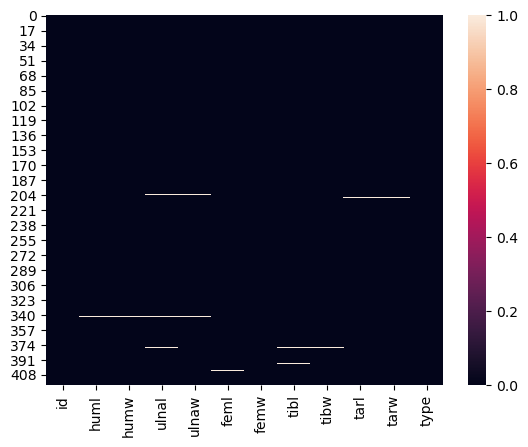

In [7]:
# heatmap() method of seaborn has been used to visualise missing values
sns.heatmap(birdsDataset.isna()); # isna() method to check NaN values in the dataset
plt.show()

#### Vertical axis shows the specific row where there is a missing value. Horizontal axis shows columns having missing values. From above we can see that there are some rows having more than one missing value and some do not have any missing value in the dataset. The dataset is small so we are not removing missing values from the dataset rather will replace with "bfill" method. This method take the value from the next row and fills the missing value. 

#### Another tecnique to deal with the missing values is imputation, which takes the mean value of each class and replace with missing value but here we do not have too much missing values so we can use "bfill" method of fillna() function of pandas dataframe it will not effect the model performance.

---------------------------------------------------------------------------------------------------------

### Class Distribution

In [8]:
birdsDataset['type'].value_counts() # Count the values of each class in column 'type'

SO    128
SW    116
W      65
R      50
P      38
T      23
Name: type, dtype: int64

#### Above list shows that we have six classes of birds in the dataset. This multi-class dataset is imbalance as each class has different number of records.

#### Visualising class distribution

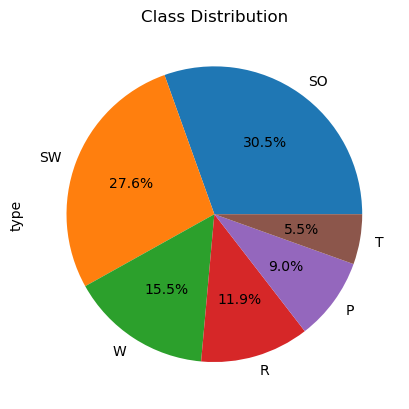

In [9]:
birdsDataset['type'].value_counts().plot(kind='pie',autopct='%1.1f%%'); # Visualisation of class proportion using pie chart
plt.title('Class Distribution')
plt.show()

#### From above pie chart we can see that our class is not equally distributed which shows class imbalance.

---------------------------------------------------------------------------------------------------------

### Check outliers in the dataset

 #### A data point that is different from the others is called an outlier. Outliers can increase the variability of the data which can decrease statistical power and can effect the performance of the model especially in small datasets. As we have a small dataset of 420 records we will remove these outliers using "Inter-Quartile Range" rule.

In [10]:
# Below function 'outlier_boxplot' has been defined to plot all the columns/features in the 
# boxplot to check the outliers in the dataset

def outlier_boxplot(columns):
    print(columns) # Print to check number of features coming from declaration of function
    plt.figure(figsize=(12,5));
    plt.subplot(1,2,1); # create a grid of subplots
    sns.boxplot(x='type', y=columns[0], data=birdsDataset);
    plt.title(columns[0]); # Title of the plot 1 (Left side)
    plt.subplot(1,2,2);
    sns.boxplot(x='type', y=columns[1], data=birdsDataset);
    plt.title(columns[1]); # Title of the plot 2 (Right side)


Index(['huml', 'humw'], dtype='object')
Index(['ulnal', 'ulnaw'], dtype='object')
Index(['feml', 'femw'], dtype='object')
Index(['tibl', 'tibw'], dtype='object')
Index(['tarl', 'tarw'], dtype='object')


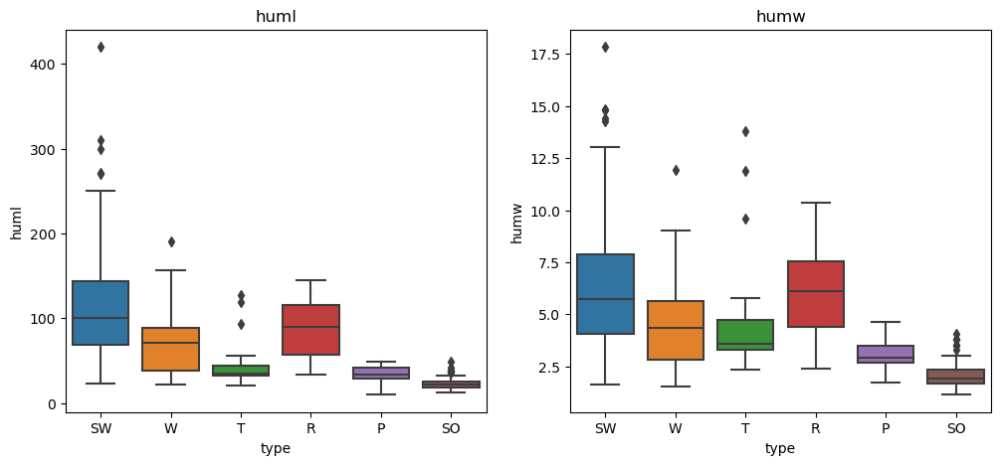

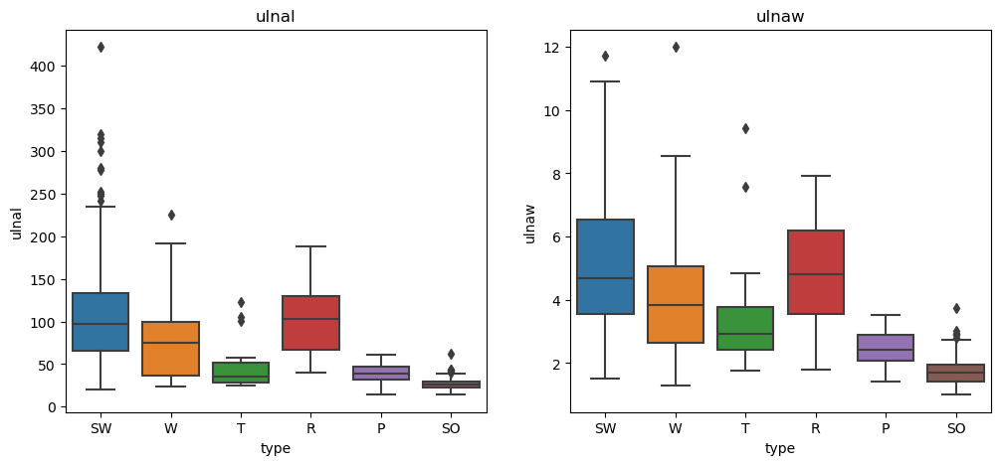

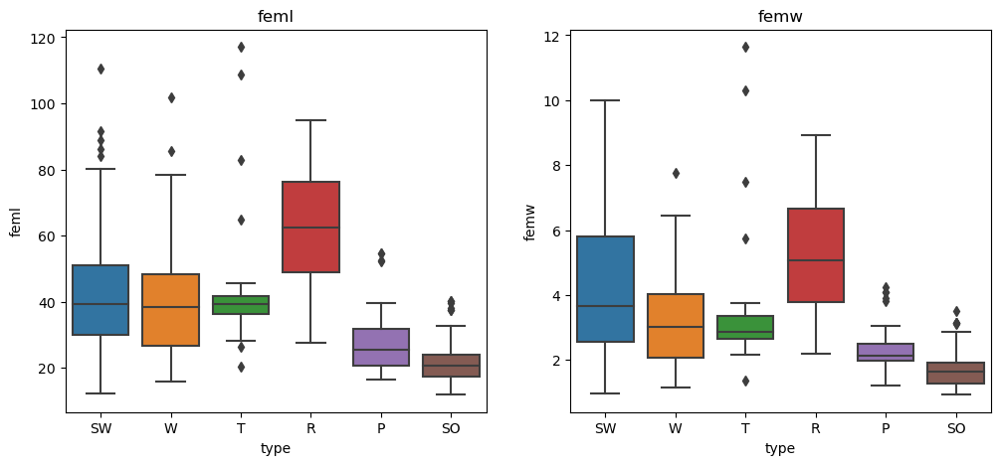

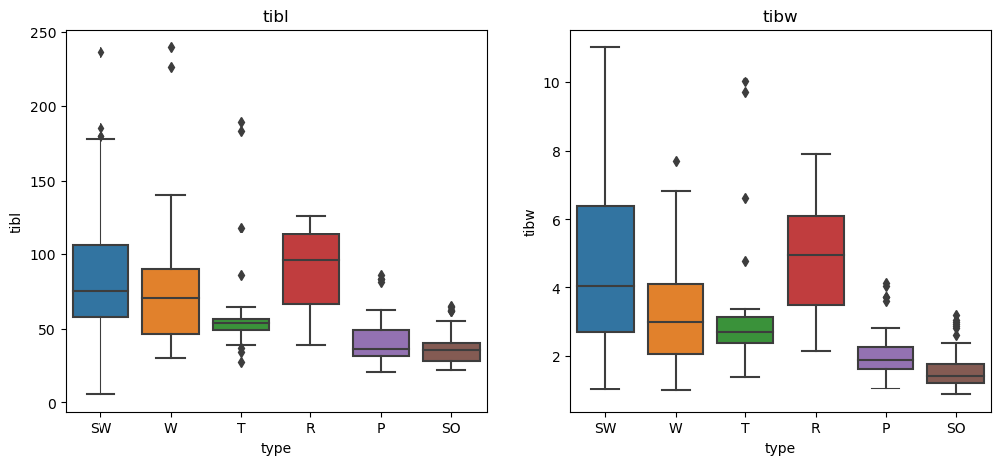

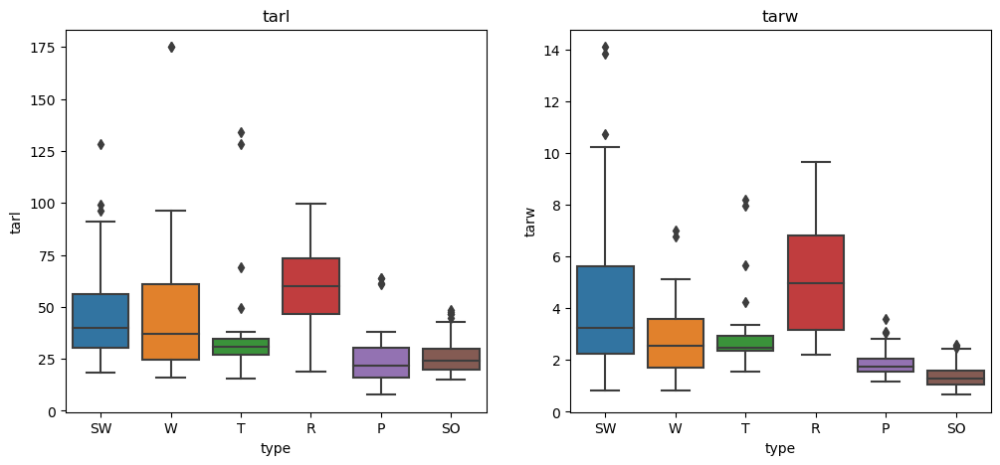

In [11]:
outlier_boxplot(birdsDataset.columns[1:3]) # function declaration
outlier_boxplot(birdsDataset.columns[3:5])
outlier_boxplot(birdsDataset.columns[5:7])
outlier_boxplot(birdsDataset.columns[7:9])
outlier_boxplot(birdsDataset.columns[9:11])

plt.show()

#### When analysing a box plot, data points outside the box plot's whiskers is referred to as an outlier. From the above subplots, "*" these data points are outliers.

---------------------------------------------------------------------------------------------------------

### Correlation

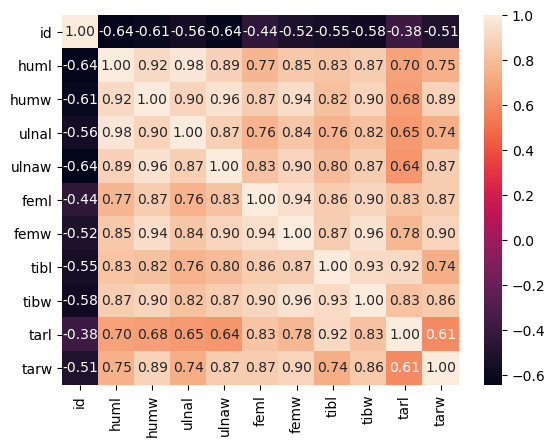

In [12]:
sns.heatmap(birdsDataset.iloc[:,:-1].corr(), annot=True, fmt='.2f');
plt.show()

#### Above heatmap shows the correlation between all the features. We can see that "id" column has a negative association with other variables and rest of the correlation ranges from 0.61 - 0.98. 

#### In data pre-processing, we will remove "id" column because it shows negative association and we will also remove those features having high correlaion. If correlation coefficient is greater or equal to 0.96 between two features we will remove one of it. Otherwise it will be like we are classifying having same features and it can also cause overfitting of the model.

| Feature 1 | Feature 2 | Correlation Coefficient >= 0.96 |
| --- | --- | --- |
| ulnal | huml | 0.98 |
| ulnaw | humw | 0.96 |
| tibw | femw | 0.96 |

---------------------------------------------------------------------------------------------------------------------------

### Pandas Profiling

#### The main objective of pandas-profiling is to give a one-line Exploratory Data Analysis (EDA) experience in a reliable and quick solution. Using this library we can see the overview, variables or features, interactions between variables, correlations and missing values of the dataset.

In [13]:
birdsDataset_profile = ProfileReport(birdsDataset, title="Bird's Dataset Report")
birdsDataset_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

 -------------------------------------------------------------------------------------------------------

## <ins>Data Pre-processing</ins>

---------------------------------------------------------------------------------------------------------

### Dealing with missing values

In [14]:
 birdsDataset.fillna(method='bfill', inplace=True)

#### As we have small dataset we are not removing those rows having missing values rather replacing them with the 'bfill' method of fillna function. It fills the missing value with the value below it.

In [15]:
birdsDataset.isnull().sum() # After filling missing values

id       0
huml     0
humw     0
ulnal    0
ulnaw    0
feml     0
femw     0
tibl     0
tibw     0
tarl     0
tarw     0
type     0
dtype: int64

---------------------------------------------------------------------------------------------------------

### Drop features having high correlation

#### High correlation features are more linearly dependant and hence have approximately the same impact on the dependent variable so we are dropping one of the feature among two. The purpose of droping one feature is to reduce overfittng, less training time and to improve the accuracy of the machine learning model.

| Feature 1 | Feature 2 | Correlation Coefficient >= 0.96 |
| --- | --- | --- |
| ulnal | huml | 0.98 |
| ulnaw | humw | 0.96 |
| tibw | femw | 0.96 |

In [16]:
birdsDataset= birdsDataset.drop(columns=['id','ulnal','humw','femw']).dropna(how='any')

---------------------------------------------------------------------------------------------------------

### Removing Outliers

#### Here we are using quantile function to remove the outliers as it determines how many values in a distribution fall inside or exceed a specific threshold.

In [17]:
def remove_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.25)
    q3 = df_in[col_name].quantile(0.75)
    iqr = q3-q1 #Interquantile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = df_in.loc[(df_in[col_name] > fence_low) & (df_in[col_name] < fence_high)]
    return df_out

In [18]:
columns = ['huml', 'ulnaw', 'feml', 'tibl','tibw','tarl','tarw']
for column in columns: # applying loop to remove outliers from each features one by one
    birdsDataset = remove_outlier(birdsDataset, column)
birdsDataset

,huml,ulnaw,feml,tibl,tibw,tarl,tarw,type
0,80.78,4.88,41.81,5.50,4.03,38.70,3.84,SW
1,88.91,5.59,47.04,80.22,4.51,41.50,4.01,SW
2,79.97,5.28,43.07,75.35,4.04,38.31,3.34,SW
3,77.65,4.77,40.04,69.17,3.40,35.78,3.41,SW
4,62.80,3.73,33.95,56.27,2.96,31.88,3.13,SW
...,...,...,...,...,...,...,...,...
415,17.96,1.33,18.36,31.25,1.33,21.99,1.15,SO
416,19.21,1.49,19.24,33.21,1.28,23.60,1.15,SO
417,18.79,1.53,20.96,34.45,1.41,22.86,1.21,SO
418,20.38,1.50,21.35,36.09,1.53,25.98,1.24,SO


--------------------------------------------------------------------------------------------------------

## <ins>Splitting the dataset for training</ins>

#### The purpose of splitting the data into test and train sets is to evaluate how well machine learning model performs on the dataset. 

In [19]:
birdsDataset.shape # check the shape of the data before splitting into train and test sets

(329, 8)

---------------------------------------------------------------------------------------------------------

### Separate independent variables from the dataset

In [20]:
X = birdsDataset.drop(['type'], axis=1) # Drop the dependent or target variable

#### Above command drops the type column from the dataset and save remaning columns to 'X' variable. Because type column is our dependent variable and the rest are independent variables.

In [21]:
X # check dataset without type column

,huml,ulnaw,feml,tibl,tibw,tarl,tarw
0,80.78,4.88,41.81,5.50,4.03,38.70,3.84
1,88.91,5.59,47.04,80.22,4.51,41.50,4.01
2,79.97,5.28,43.07,75.35,4.04,38.31,3.34
3,77.65,4.77,40.04,69.17,3.40,35.78,3.41
4,62.80,3.73,33.95,56.27,2.96,31.88,3.13
...,...,...,...,...,...,...,...
415,17.96,1.33,18.36,31.25,1.33,21.99,1.15
416,19.21,1.49,19.24,33.21,1.28,23.60,1.15
417,18.79,1.53,20.96,34.45,1.41,22.86,1.21
418,20.38,1.50,21.35,36.09,1.53,25.98,1.24


--------------------------------------------------------------------------------------------------------

### Transform non-numerical dependent variable 'type' to numerical values

In [22]:
enc=LabelEncoder() # To transform non-numerical to numerical labels
y=enc.fit_transform(birdsDataset['type'])

#### LabelEncoder() has been used to transform non-numerical labels to numerical labels.

In [23]:
y # check dependent variable after transformation

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

--------------------------------------------------------------------------------------------------------

### Splitting of dataset into train and test sets

#### We are splitting the data into 80/20 rule, 80% for training and 20% for test. We are applying this rule as in most cases, 80% of effects come from 20% of causes. Below parameter test_size=0.2 shows 20% data for test set. The hyperparameter random_state = 42 has been used as it can reduce the error and enhance model performance.

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size= 0.2, random_state = 42)

In [25]:
X_train.shape #Check training independent variables

(263, 7)

In [26]:
X_test.shape #Check test independent variables

(66, 7)

In [27]:
y_train.shape #Check training dependent variable

(263,)

In [28]:
y_test.shape #Check test dependent variable

(66,)

---------------------------------------------------------------------------------------------------------

### Standardise Dataset using Standard scaler method of scikit learn preprocessing 

#### StandardScaler removes the mean and scales each feature/variable to unit variance. It has been used to reduce the dominance of one feature to the other.

In [29]:
standard_scaler=StandardScaler()
X_train = standard_scaler.fit_transform(X_train)
X_test = standard_scaler.transform(X_test)

X_train.shape
X_test.shape

(66, 7)

---------------------------------------------------------------------------------------------------------------------------

### Normalise Dataset using MinMaxScaler method of scikit learn preprocessing 

#### This estimator scales and translates each feature separately so that it falls inside the training set's predefined range, such as between zero and one. It helps to streamline the data, training stability and performance of the model.

In [30]:
minmax_scaler = MinMaxScaler()
X_train= minmax_scaler.fit_transform(X_train)
X_test = minmax_scaler.transform(X_test)


X_train.shape
X_test.shape

(66, 7)

---------------------------------------------------------------------------------------------------------------------------

### Class Balancing using oversampling technique RandomOverSampler

#### The purpose of class balancing is to prevent model to give biased results towards one class. In this dataset model can be biased for classes "SO" and "SW" as these both classes have more records than others. To avoid biasing we are using "RandomOverSampler" re-sampling technique. Oversampling technique has been used for this dataset becasue of the small size of the data.

In [31]:
ros = RandomOverSampler(random_state=0)
ros.fit(X_train, y_train)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)
len(X_resampled) # length of 

618

In [32]:
len(y_resampled)

618

#### Check classes after balancing

In [33]:
arr = np.array(y_resampled)
classes, counts = np.unique(arr, return_counts=True)
for clas in classes: 
    print('Class ',clas,':', counts[clas])


Class  0 : 103
Class  1 : 103
Class  2 : 103
Class  3 : 103
Class  4 : 103
Class  5 : 103


--------------------------------------------------------------------------------------------------------

## <ins>Classfication of birds species using different classifiers or algorithms</ins>

#### In our dataset we have six classes of birds in the target variable "type" which means it's a multi-class problem. Five different machine learning classifiers has been chosen which can deal with multi-class problem. 

#### The purpose of using five algorithms is to determine which algorithm yields the best results. To find the best hyperparameters for each algorithm, "GridSearchCV" has been used.

-------------------------------------------------------------------------------------------------------

In [46]:
table_columns = ["Model", "Accuracy", "Precision", "Recall", "F1 score", "Sensitivity", "Specificity"] # List to set the columns for the table in which results of all the models will be shown

In [47]:
result_with_class_balance = [] # An array of the results of the all models

In [48]:
mis_loss_classification_table = ["Model", "Mis-Classification", "Loss"] # List to set the columns for the table in which mis-classification and loss of all the models will be shown

In [49]:
mis_loss_classification_results = [] # An array of the misclassified and loss of the all models

---------------------------------------------------------------------------------------------------------

 ### **SGD Classifier**

---------------------------------------------------------------------------------------------------------

 ### *<ins>Hyperparmaters Tuning using Grid Search</ins>*

#### Let's perform hyperparameter tuning because it can give optimised hyperparameter values which can increase the predicted accuracy of the model.

In [50]:
warnings.filterwarnings('ignore') #ignore warning from the below GridSearch function so we do not need to scroll more

params = { # list of parameters
    "loss" : ["hinge", "log", "squared_hinge", "modified_huber"],
    "alpha" : [0.0001, 0.001, 0.01, 0.1],
    "penalty" : ["l2", "l1", "none"],
}

model = SGDClassifier(max_iter=1000)
clf = GridSearchCV(model, param_grid=params) # Passing SGD classifier and parameters to grid search cv
clf.fit(X_resampled,y_resampled) # fitting the data to grid search to get the best parameters
print(clf.best_estimator_) # Print best parameters for SGD classifier 

SGDClassifier(alpha=0.001, loss='modified_huber', penalty='l1')


In [51]:
sgd_classifier = SGDClassifier(alpha=0.001, loss='modified_huber', penalty='l1') #SGD Classifier with hyperparameters
sgd_classifier.fit(X_resampled,y_resampled) # train the model on train set
y_pred = sgd_classifier.predict(X_test) # Prediction

accuracy = accuracy_score(y_test, y_pred) #Check accuracy of the trained model
precision = precision_score(y_test, y_pred, average='macro') #Check precision of the trained model
recall = recall_score(y_test, y_pred, average='macro') #Check recall of the trained model

In [52]:
conf_matrix=confusion_matrix(y_test,sgd_classifier.predict(X_test)) #Confusion matrix

FP = conf_matrix.sum(axis=0) - np.diag(conf_matrix) # False Positive
FN = conf_matrix.sum(axis=1) - np.diag(conf_matrix) # False Negative
TP = np.diag(conf_matrix) # True Positive
TN = conf_matrix.sum() - (FP + FN + TP) #True Negative

# FPR = FP/(FP+TN)
# TPR = TP/(TP+FN) # Recall

specificity_of_all_classes = TN/(TN+FP) #Array of specificity of all classes
sum_of_all_classes = 0
for i in specificity_of_all_classes:
    sum_of_all_classes = sum_of_all_classes +i
average_specificity = sum_of_all_classes/ len(specificity_of_all_classes) #Specificity of the model


In [53]:
result_with_class_balance.append(['SGD Classifier', accuracy, precision, recall, f1_score(y_test,y_pred, average='macro'), recall, average_specificity]);

In [54]:
print(tabulate(result_with_class_balance, headers=table_columns, tablefmt="fancy_grid"))

╒════════════════╤════════════╤═════════════╤══════════╤════════════╤═══════════════╤═══════════════╕
│ Model          │   Accuracy │   Precision │   Recall │   F1 score │   Sensitivity │   Specificity │
╞════════════════╪════════════╪═════════════╪══════════╪════════════╪═══════════════╪═══════════════╡
│ SGD Classifier │   0.742424 │    0.680833 │ 0.737201 │   0.633449 │      0.737201 │      0.950362 │
╘════════════════╧════════════╧═════════════╧══════════╧════════════╧═══════════════╧═══════════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification</ins>*

In [55]:
#Misclassification of the model
mis_classification = (FP + FN) / (TP + TN + FP + FN)
sum_of_all = 0
for i in mis_classification:
    sum_of_all = sum_of_all +i
average_mis_classification = sum_of_all/ len(mis_classification) #Misclassification
print("Mis-Classification: ",average_mis_classification)

Mis-Classification:  0.08585858585858586


--------------------------------------------------------------------------------------------------------------------------

 ### *<ins>Loss</ins>*

In [56]:
error_rate = []
for i in y_test: # This loop is checking where predicted result and target result is not matching and saving to error rate array
    error_rate.append(np.mean(y_pred != y_test))


sum_of_all_loss = 0
for i in error_rate: #Sum of the error rates
    sum_of_all_loss = sum_of_all_loss +i
overall_loss = sum_of_all_loss/ len(error_rate) #Overall loss of the model
print("Loss: ",overall_loss)

Loss:  0.25757575757575774


--------------------------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification and Loss Table</ins>*

In [57]:
mis_loss_classification_results.append(['SGD Classifier', average_mis_classification, overall_loss]);

In [58]:
print(tabulate(mis_loss_classification_results, headers=mis_loss_classification_table, tablefmt="fancy_grid"))

╒════════════════╤══════════════════════╤══════════╕
│ Model          │   Mis-Classification │     Loss │
╞════════════════╪══════════════════════╪══════════╡
│ SGD Classifier │            0.0858586 │ 0.257576 │
╘════════════════╧══════════════════════╧══════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Confusion Matrix</ins>*

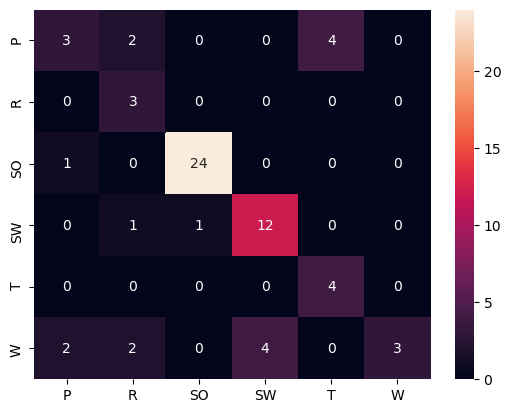

In [59]:
sns.heatmap(confusion_matrix(y_test,sgd_classifier.predict(X_test)),xticklabels= enc.classes_,
            yticklabels=enc.classes_, annot=True,fmt='d')
plt.show()

#### The above matrix table define the performance of the classification algorithm. The diagonal elements represents the number of points where the predicted value is true while the off-diagonal elements represents the number of points which are mis-classified by the algorithm. 

--------------------------------------------------------------------------------------------------------------------------

 ### *<ins>Classification Report</ins>*

In [60]:
print(classification_report(y_test,y_pred)) # This method gives the overall report of the trained model

              precision    recall  f1-score   support

           0       0.50      0.33      0.40         9
           1       0.38      1.00      0.55         3
           2       0.96      0.96      0.96        25
           3       0.75      0.86      0.80        14
           4       0.50      1.00      0.67         4
           5       1.00      0.27      0.43        11

    accuracy                           0.74        66
   macro avg       0.68      0.74      0.63        66
weighted avg       0.80      0.74      0.72        66



#### From above report we an see the precision, recall, f1-score and support of all the 6 classes

---------------------------------------------------------------------------------------------------------

 ### *<ins>Area Under the Curve</ins>*

In [61]:
lb = LabelBinarizer().fit(y_train)
y_lb_test = lb.transform(y_test)
y_lb_test.shape 

(66, 6)

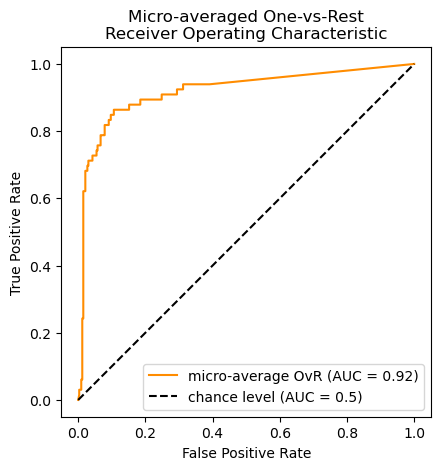

In [62]:
y_score = sgd_classifier.fit(X_resampled, y_resampled).predict_proba(X_test)

RocCurveDisplay.from_predictions(
    y_lb_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

---------------------------------------------------------------------------------------------------------

 ### **Random Forest**

---------------------------------------------------------------------------------------------------------

 ### *<ins>Hyperparmaters Tuning using Grid Search</ins>*

#### Let's perform hyperparameter tuning because it can give optimised hyperparameter values which can increase the predicted accuracy of your model.

In [63]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
# Instantiate the grid search model
grid_search.fit(X_resampled, y_resampled)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


{'bootstrap': True,
 'max_depth': 90,
 'max_features': 2,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1000}

In [64]:
random_forest=RandomForestClassifier(bootstrap= True,
 max_depth= 90,
 max_features= 2,
 min_samples_leaf= 3,
 min_samples_split= 8,
 n_estimators= 1000)
random_forest.fit(X_resampled, y_resampled) # train the model on train set
y_pred = random_forest.predict(X_test) # Prediction


accuracy = accuracy_score(y_test, y_pred) #Check accuracy of the trained model
precision = precision_score(y_test, y_pred, average='macro') #Check precision of the trained model
recall = recall_score(y_test, y_pred, average='macro') #Check recall of the trained model

In [65]:
conf_matrix=confusion_matrix(y_test,random_forest.predict(X_test)) #Confusion matrix

FP = conf_matrix.sum(axis=0) - np.diag(conf_matrix) # False Positive
FN = conf_matrix.sum(axis=1) - np.diag(conf_matrix) # False Negative
TP = np.diag(conf_matrix) # True Positive
TN = conf_matrix.sum() - (FP + FN + TP) #True Negative

specificity_of_all_classes = TN/(TN+FP) #Array of specificity of all classes
sum_of_all_classes = 0
for i in specificity_of_all_classes:
    sum_of_all_classes = sum_of_all_classes +i
average_specificity = sum_of_all_classes/ len(specificity_of_all_classes) #Specificity of the model


In [66]:
result_with_class_balance.append(['Random Forest', accuracy, precision, recall, f1_score(y_test,y_pred, average='macro'), recall, average_specificity]);

In [67]:
print(tabulate(result_with_class_balance, headers=table_columns, tablefmt="fancy_grid"))

╒════════════════╤════════════╤═════════════╤══════════╤════════════╤═══════════════╤═══════════════╕
│ Model          │   Accuracy │   Precision │   Recall │   F1 score │   Sensitivity │   Specificity │
╞════════════════╪════════════╪═════════════╪══════════╪════════════╪═══════════════╪═══════════════╡
│ SGD Classifier │   0.742424 │    0.680833 │ 0.737201 │   0.633449 │      0.737201 │      0.950362 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Random Forest  │   0.787879 │    0.757772 │ 0.766121 │   0.745475 │      0.766121 │      0.953096 │
╘════════════════╧════════════╧═════════════╧══════════╧════════════╧═══════════════╧═══════════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification</ins>*

In [68]:
#Misclassification of the model
mis_classification = (FP + FN) / (TP + TN + FP + FN)
sum_of_all = 0
for i in mis_classification:
    sum_of_all = sum_of_all +i
average_mis_classification = sum_of_all/ len(mis_classification) #Misclassification
print("Mis-Classification: ",average_mis_classification)

Mis-Classification:  0.0707070707070707


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Loss</ins>*

In [69]:
error_rate = []
for i in y_test: # This loop is checking where predicted result and target result is not matching and saving to error rate array
    error_rate.append(np.mean(y_pred != y_test))


sum_of_all_loss = 0
for i in error_rate: #Sum of the error rates
    sum_of_all_loss = sum_of_all_loss +i
overall_loss = sum_of_all_loss/ len(error_rate) #Overall loss of the model
print("Loss: ",overall_loss)

Loss:  0.21212121212121235


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification and Loss Table</ins>*

In [70]:
mis_loss_classification_results.append(['Random Forest', average_mis_classification, overall_loss]);

In [71]:
print(tabulate(mis_loss_classification_results, headers=mis_loss_classification_table, tablefmt="fancy_grid"))

╒════════════════╤══════════════════════╤══════════╕
│ Model          │   Mis-Classification │     Loss │
╞════════════════╪══════════════════════╪══════════╡
│ SGD Classifier │            0.0858586 │ 0.257576 │
├────────────────┼──────────────────────┼──────────┤
│ Random Forest  │            0.0707071 │ 0.212121 │
╘════════════════╧══════════════════════╧══════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Confusion Matrix</ins>*

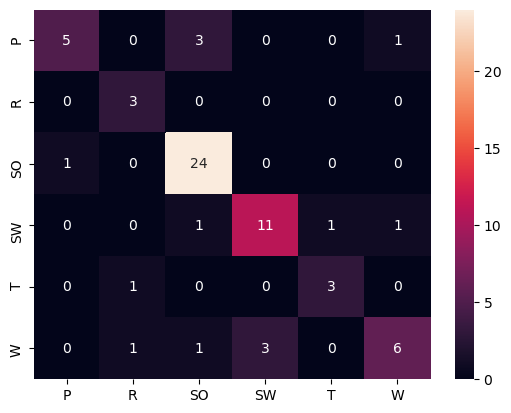

In [72]:
sns.heatmap(confusion_matrix(y_test,random_forest.predict(X_test)),xticklabels= enc.classes_,
            yticklabels=enc.classes_, annot=True,fmt='d')
plt.show()

#### The above matrix table define the performance of the classification algorithm. The diagonal elements represents the number of points where the predicted value is true while the off-diagonal elements represents the number of points which are mis-classified by the algorithm. 

--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Classification Report</ins>*

In [73]:
print(classification_report(y_test,y_pred)) # This method gives the overall report of the trained model

              precision    recall  f1-score   support

           0       0.83      0.56      0.67         9
           1       0.60      1.00      0.75         3
           2       0.83      0.96      0.89        25
           3       0.79      0.79      0.79        14
           4       0.75      0.75      0.75         4
           5       0.75      0.55      0.63        11

    accuracy                           0.79        66
   macro avg       0.76      0.77      0.75        66
weighted avg       0.79      0.79      0.78        66



---------------------------------------------------------------------------------------------------------

 ### *<ins>Area Under the Curve</ins>*

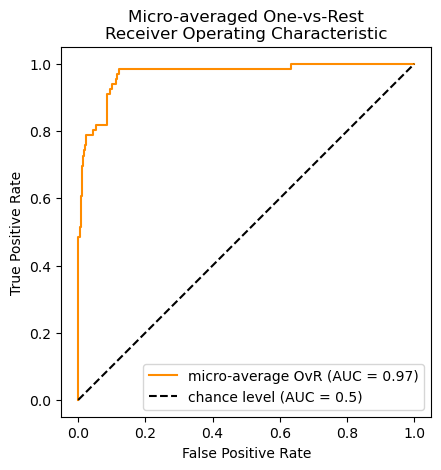

In [74]:
y_score = random_forest.fit(X_resampled, y_resampled).predict_proba(X_test)

RocCurveDisplay.from_predictions(
    y_lb_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

---------------------------------------------------------------------------------------------------------

 ### **Ada Boost Classifier**

---------------------------------------------------------------------------------------------------------

#### Best Hyperparameters 
#### base_estimator == criterion='entropy',random_state=1, max_depth=5
#### (n_estimators=500, learning_rate=0.1, random_state=5)

In [75]:
decision_tree_ada = DecisionTreeClassifier(criterion='entropy',random_state=1, max_depth=5)
ada_boost_classifier = AdaBoostClassifier( base_estimator = decision_tree_ada, n_estimators=500, learning_rate=0.1, random_state=5)
ada_boost_classifier.fit(X_resampled, y_resampled) # train the model on train set
y_pred = ada_boost_classifier.predict(X_test) # Prediction


accuracy = accuracy_score(y_test, y_pred) #Check accuracy of the trained model
precision = precision_score(y_test, y_pred, average='macro') #Check precision of the trained model
recall = recall_score(y_test, y_pred, average='macro') #Check recall of the trained model

In [76]:
conf_matrix=confusion_matrix(y_test,ada_boost_classifier.predict(X_test)) #Confusion matrix

FP = conf_matrix.sum(axis=0) - np.diag(conf_matrix) # False Positive
FN = conf_matrix.sum(axis=1) - np.diag(conf_matrix) # False Negative
TP = np.diag(conf_matrix) # True Positive
TN = conf_matrix.sum() - (FP + FN + TP) #True Negative

specificity_of_all_classes = TN/(TN+FP) #Array of specificity of all classes
sum_of_all_classes = 0
for i in specificity_of_all_classes:
    sum_of_all_classes = sum_of_all_classes +i
average_specificity = sum_of_all_classes/ len(specificity_of_all_classes) #Specificity of the model


In [77]:
result_with_class_balance.append(['Ada Boost', accuracy, precision, recall, f1_score(y_test,y_pred, average='macro'), recall, average_specificity]);

In [78]:
print(tabulate(result_with_class_balance, headers=table_columns, tablefmt="fancy_grid"))

╒════════════════╤════════════╤═════════════╤══════════╤════════════╤═══════════════╤═══════════════╕
│ Model          │   Accuracy │   Precision │   Recall │   F1 score │   Sensitivity │   Specificity │
╞════════════════╪════════════╪═════════════╪══════════╪════════════╪═══════════════╪═══════════════╡
│ SGD Classifier │   0.742424 │    0.680833 │ 0.737201 │   0.633449 │      0.737201 │      0.950362 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Random Forest  │   0.787879 │    0.757772 │ 0.766121 │   0.745475 │      0.766121 │      0.953096 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Ada Boost      │   0.772727 │    0.717476 │ 0.710445 │   0.706692 │      0.710445 │      0.950347 │
╘════════════════╧════════════╧═════════════╧══════════╧════════════╧═══════════════╧═══════════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification</ins>*

In [79]:
#Misclassification of the model
mis_classification = (FP + FN) / (TP + TN + FP + FN)
sum_of_all = 0
for i in mis_classification:
    sum_of_all = sum_of_all +i
average_mis_classification = sum_of_all/ len(mis_classification) #Misclassification
print("Mis-Classification: ",average_mis_classification)

Mis-Classification:  0.07575757575757576


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Loss</ins>*

In [80]:
error_rate = []
for i in y_test: # This loop is checking where predicted result and target result is not matching and saving to error rate array
    error_rate.append(np.mean(y_pred != y_test))


sum_of_all_loss = 0
for i in error_rate: #Sum of the error rates
    sum_of_all_loss = sum_of_all_loss +i
overall_loss = sum_of_all_loss/ len(error_rate) #Overall loss of the model
print("Loss: ",overall_loss)

Loss:  0.22727272727272702


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification and Loss Table</ins>*

In [81]:
mis_loss_classification_results.append(['Ada Boost', average_mis_classification, overall_loss]);

In [82]:
print(tabulate(mis_loss_classification_results, headers=mis_loss_classification_table, tablefmt="fancy_grid"))

╒════════════════╤══════════════════════╤══════════╕
│ Model          │   Mis-Classification │     Loss │
╞════════════════╪══════════════════════╪══════════╡
│ SGD Classifier │            0.0858586 │ 0.257576 │
├────────────────┼──────────────────────┼──────────┤
│ Random Forest  │            0.0707071 │ 0.212121 │
├────────────────┼──────────────────────┼──────────┤
│ Ada Boost      │            0.0757576 │ 0.227273 │
╘════════════════╧══════════════════════╧══════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Confusion Matrix</ins>*

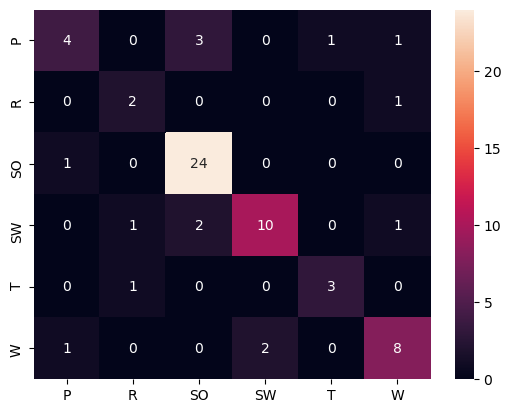

In [83]:
sns.heatmap(confusion_matrix(y_test,ada_boost_classifier.predict(X_test)),xticklabels= enc.classes_,
            yticklabels=enc.classes_, annot=True,fmt='d')
plt.show()

#### The above matrix table define the performance of the classification algorithm. The diagonal elements represents the number of points where the predicted value is true while the off-diagonal elements represents the number of points which are mis-classified by the algorithm. 

--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Classification Report</ins>*

In [84]:
print(classification_report(y_test,y_pred)) # This method gives the overall report of the trained model

              precision    recall  f1-score   support

           0       0.67      0.44      0.53         9
           1       0.50      0.67      0.57         3
           2       0.83      0.96      0.89        25
           3       0.83      0.71      0.77        14
           4       0.75      0.75      0.75         4
           5       0.73      0.73      0.73        11

    accuracy                           0.77        66
   macro avg       0.72      0.71      0.71        66
weighted avg       0.77      0.77      0.77        66



---------------------------------------------------------------------------------------------------------

 ### *<ins>Area Under the Curve</ins>*

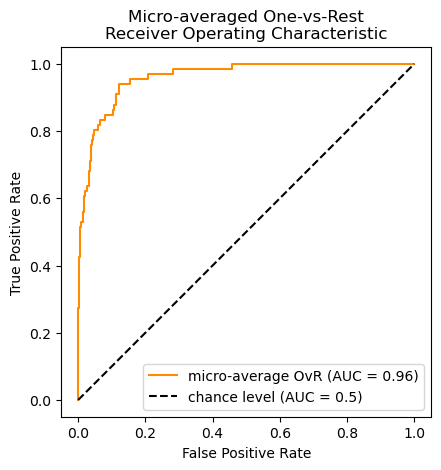

In [85]:
y_score = ada_boost_classifier.fit(X_resampled, y_resampled).predict_proba(X_test)

RocCurveDisplay.from_predictions(
    y_lb_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

---------------------------------------------------------------------------------------------------------

 ### **Gradient Boost Classifier**

-------------------------------------------------------------------------------------------------------------------

#### Best hyperparameters = random_state=5, n_estimators=1000, max_depth=4

In [86]:
gb_boost_classifier = GradientBoostingClassifier(random_state=5, n_estimators=1000, max_depth=4)
gb_boost_classifier.fit(X_resampled,y_resampled) # train the model on train set
y_pred = gb_boost_classifier.predict(X_test) # Prediction


accuracy = accuracy_score(y_test, y_pred) #Check accuracy of the trained model
precision = precision_score(y_test, y_pred, average='macro') #Check precision of the trained model
recall = recall_score(y_test, y_pred, average='macro') #Check recall of the trained model

In [87]:
conf_matrix=confusion_matrix(y_test,gb_boost_classifier.predict(X_test)) #Confusion matrix

FP = conf_matrix.sum(axis=0) - np.diag(conf_matrix) # False Positive
FN = conf_matrix.sum(axis=1) - np.diag(conf_matrix) # False Negative
TP = np.diag(conf_matrix) # True Positive
TN = conf_matrix.sum() - (FP + FN + TP) #True Negative

specificity_of_all_classes = TN/(TN+FP) #Array of specificity of all classes
sum_of_all_classes = 0
for i in specificity_of_all_classes:
    sum_of_all_classes = sum_of_all_classes +i
average_specificity = sum_of_all_classes/ len(specificity_of_all_classes) #Specificity of the model


In [88]:
result_with_class_balance.append(['Gradient Boost', accuracy, precision, recall, f1_score(y_test,y_pred, average='macro'), recall, average_specificity]);

In [89]:
print(tabulate(result_with_class_balance, headers=table_columns, tablefmt="fancy_grid"))

╒════════════════╤════════════╤═════════════╤══════════╤════════════╤═══════════════╤═══════════════╕
│ Model          │   Accuracy │   Precision │   Recall │   F1 score │   Sensitivity │   Specificity │
╞════════════════╪════════════╪═════════════╪══════════╪════════════╪═══════════════╪═══════════════╡
│ SGD Classifier │   0.742424 │    0.680833 │ 0.737201 │   0.633449 │      0.737201 │      0.950362 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Random Forest  │   0.787879 │    0.757772 │ 0.766121 │   0.745475 │      0.766121 │      0.953096 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Ada Boost      │   0.772727 │    0.717476 │ 0.710445 │   0.706692 │      0.710445 │      0.950347 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Gradient Boost │   0.818182 │    0.752315 │ 0.785248 │   0.764135 │      0.78524

--------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification</ins>*

In [90]:
#Misclassification of the model
mis_classification = (FP + FN) / (TP + TN + FP + FN)
sum_of_all = 0
for i in mis_classification:
    sum_of_all = sum_of_all +i
average_mis_classification = sum_of_all/ len(mis_classification) #Misclassification
print("Mis-Classification: ",average_mis_classification)

Mis-Classification:  0.06060606060606061


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Loss</ins>*

In [91]:
error_rate = []
for i in y_test: # This loop is checking where predicted result and target result is not matching and saving to error rate array
    error_rate.append(np.mean(y_pred != y_test))


sum_of_all_loss = 0
for i in error_rate: #Sum of the error rates
    sum_of_all_loss = sum_of_all_loss +i
overall_loss = sum_of_all_loss/ len(error_rate) #Overall loss of the model
print("Loss: ",overall_loss)

Loss:  0.1818181818181817


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification and Loss Table</ins>*

In [92]:
mis_loss_classification_results.append(['Gradient Boost', average_mis_classification, overall_loss]);

In [93]:
print(tabulate(mis_loss_classification_results, headers=mis_loss_classification_table, tablefmt="fancy_grid"))

╒════════════════╤══════════════════════╤══════════╕
│ Model          │   Mis-Classification │     Loss │
╞════════════════╪══════════════════════╪══════════╡
│ SGD Classifier │            0.0858586 │ 0.257576 │
├────────────────┼──────────────────────┼──────────┤
│ Random Forest  │            0.0707071 │ 0.212121 │
├────────────────┼──────────────────────┼──────────┤
│ Ada Boost      │            0.0757576 │ 0.227273 │
├────────────────┼──────────────────────┼──────────┤
│ Gradient Boost │            0.0606061 │ 0.181818 │
╘════════════════╧══════════════════════╧══════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Confusion Matrix</ins>*

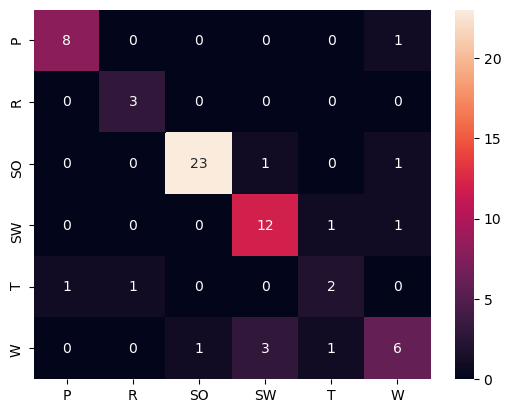

In [94]:
sns.heatmap(confusion_matrix(y_test,gb_boost_classifier.predict(X_test)),xticklabels= enc.classes_,
            yticklabels=enc.classes_, annot=True,fmt='d')
plt.show()

#### The above matrix table define the performance of the classification algorithm. The diagonal elements represents the number of points where the predicted value is true while the off-diagonal elements represents the number of points which are mis-classified by the algorithm. 

--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Classification Report</ins>*

In [95]:
print(classification_report(y_test,y_pred)) # This method gives the overall report of the trained model

              precision    recall  f1-score   support

           0       0.89      0.89      0.89         9
           1       0.75      1.00      0.86         3
           2       0.96      0.92      0.94        25
           3       0.75      0.86      0.80        14
           4       0.50      0.50      0.50         4
           5       0.67      0.55      0.60        11

    accuracy                           0.82        66
   macro avg       0.75      0.79      0.76        66
weighted avg       0.82      0.82      0.82        66



---------------------------------------------------------------------------------------------------------

 ### *<ins>Area Under the Curve</ins>*

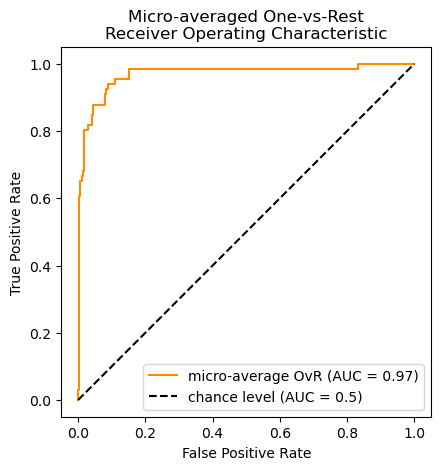

In [96]:
y_score = gb_boost_classifier.fit(X_resampled, y_resampled).predict_proba(X_test)

RocCurveDisplay.from_predictions(
    y_lb_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

---------------------------------------------------------------------------------------------------------

 ### **K-Nearest Neighbour**

-------------------------------------------------------------------------------------------------------------------

 ### *<ins>Hyperparmaters Tuning using Grid Search</ins>*

#### Let's perform hyperparameter tuning because it can give optimised hyperparameter values which can increase the predicted accuracy of your model.

In [121]:
knn = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid = dict(n_neighbors=k_range)
  
# defining parameter range
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', return_train_score=False,verbose=1)
  
# fitting the model for grid search
grid_search=grid.fit(X_resampled, y_resampled)
print(grid_search.best_params_)


Fitting 10 folds for each of 30 candidates, totalling 300 fits
{'n_neighbors': 1}


In [122]:
knn_classifier = KNeighborsClassifier(n_neighbors= 1)
knn_classifier.fit(X_resampled,y_resampled) # train the model on train set
y_pred = knn_classifier.predict(X_test) # Prediction


accuracy = accuracy_score(y_test, y_pred) #Check accuracy of the trained model
precision = precision_score(y_test, y_pred, average='macro') #Check precision of the trained model
recall = recall_score(y_test, y_pred, average='macro') #Check recall of the trained model

In [123]:
conf_matrix=confusion_matrix(y_test,knn_classifier.predict(X_test)) #Confusion matrix

FP = conf_matrix.sum(axis=0) - np.diag(conf_matrix) # False Positive
FN = conf_matrix.sum(axis=1) - np.diag(conf_matrix) # False Negative
TP = np.diag(conf_matrix) # True Positive
TN = conf_matrix.sum() - (FP + FN + TP) #True Negative

specificity_of_all_classes = TN/(TN+FP) #Array of specificity of all classes
sum_of_all_classes = 0
for i in specificity_of_all_classes:
    sum_of_all_classes = sum_of_all_classes +i
average_specificity = sum_of_all_classes/ len(specificity_of_all_classes) #Specificity of the model


In [124]:
result_with_class_balance.append(['KNN', accuracy, precision, recall, f1_score(y_test,y_pred, average='macro'), recall, average_specificity]);

In [125]:
print(tabulate(result_with_class_balance, headers=table_columns, tablefmt="fancy_grid"))

╒════════════════╤════════════╤═════════════╤══════════╤════════════╤═══════════════╤═══════════════╕
│ Model          │   Accuracy │   Precision │   Recall │   F1 score │   Sensitivity │   Specificity │
╞════════════════╪════════════╪═════════════╪══════════╪════════════╪═══════════════╪═══════════════╡
│ SGD Classifier │   0.742424 │    0.680833 │ 0.737201 │   0.633449 │      0.737201 │      0.950362 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Random Forest  │   0.787879 │    0.757772 │ 0.766121 │   0.745475 │      0.766121 │      0.953096 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Ada Boost      │   0.772727 │    0.717476 │ 0.710445 │   0.706692 │      0.710445 │      0.950347 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Gradient Boost │   0.818182 │    0.752315 │ 0.785248 │   0.764135 │      0.78524

---------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification</ins>*

In [126]:
#Misclassification of the model
mis_classification = (FP + FN) / (TP + TN + FP + FN)
sum_of_all = 0
for i in mis_classification:
    sum_of_all = sum_of_all +i
average_mis_classification = sum_of_all/ len(mis_classification) #Misclassification
print("Mis-Classification: ",average_mis_classification)

Mis-Classification:  0.03535353535353535


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Loss</ins>*

In [127]:
error_rate = []
for i in y_test: # This loop is checking where predicted result and target result is not matching and saving to error rate array
    error_rate.append(np.mean(y_pred != y_test))


sum_of_all_loss = 0
for i in error_rate: #Sum of the error rates
    sum_of_all_loss = sum_of_all_loss +i
overall_loss = sum_of_all_loss/ len(error_rate) #Overall loss of the model
print("Loss: ",overall_loss)

Loss:  0.10606060606060617


--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Mis-Classification and Loss Table</ins>*

In [128]:
mis_loss_classification_results.append(['KNN', average_mis_classification, overall_loss]);

In [129]:
print(tabulate(mis_loss_classification_results, headers=mis_loss_classification_table, tablefmt="fancy_grid"))

╒════════════════╤══════════════════════╤══════════╕
│ Model          │   Mis-Classification │     Loss │
╞════════════════╪══════════════════════╪══════════╡
│ SGD Classifier │            0.0858586 │ 0.257576 │
├────────────────┼──────────────────────┼──────────┤
│ Random Forest  │            0.0707071 │ 0.212121 │
├────────────────┼──────────────────────┼──────────┤
│ Ada Boost      │            0.0757576 │ 0.227273 │
├────────────────┼──────────────────────┼──────────┤
│ Gradient Boost │            0.0606061 │ 0.181818 │
├────────────────┼──────────────────────┼──────────┤
│ KNN            │            0.0505051 │ 0.151515 │
├────────────────┼──────────────────────┼──────────┤
│ KNN            │            0.0353535 │ 0.106061 │
╘════════════════╧══════════════════════╧══════════╛


---------------------------------------------------------------------------------------------------------

 ### *<ins>Confusion Matrix</ins>*

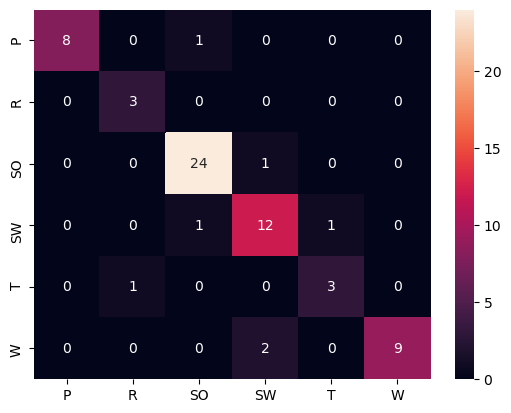

In [130]:
sns.heatmap(confusion_matrix(y_test,knn_classifier.predict(X_test)),xticklabels= enc.classes_,
            yticklabels=enc.classes_, annot=True,fmt='d')
plt.show()

#### The above matrix table define the performance of the classification algorithm. The diagonal elements represents the number of points where the predicted value is true while the off-diagonal elements represents the number of points which are mis-classified by the algorithm. 

--------------------------------------------------------------------------------------------------------------------

 ### *<ins>Classification Report</ins>*

In [131]:
print(classification_report(y_test,y_pred)) # This method gives the overall report of the trained model

              precision    recall  f1-score   support

           0       1.00      0.89      0.94         9
           1       0.75      1.00      0.86         3
           2       0.92      0.96      0.94        25
           3       0.80      0.86      0.83        14
           4       0.75      0.75      0.75         4
           5       1.00      0.82      0.90        11

    accuracy                           0.89        66
   macro avg       0.87      0.88      0.87        66
weighted avg       0.90      0.89      0.89        66



---------------------------------------------------------------------------------------------------------

 ### *<ins>Area Under the Curve</ins>*

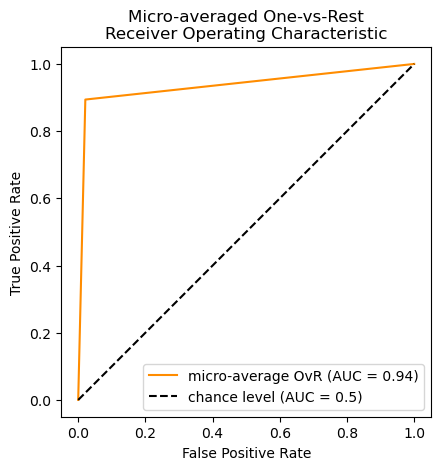

In [132]:
y_score = knn_classifier.fit(X_resampled, y_resampled).predict_proba(X_test)

RocCurveDisplay.from_predictions(
    y_lb_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

---------------------------------------------------------------------------------------------------------

  # *<ins>Results</ins>*

  ## *<ins>Comparison Between The Models</ins>*

In [133]:
print(tabulate(result_with_class_balance, headers=table_columns, tablefmt="fancy_grid"))

╒════════════════╤════════════╤═════════════╤══════════╤════════════╤═══════════════╤═══════════════╕
│ Model          │   Accuracy │   Precision │   Recall │   F1 score │   Sensitivity │   Specificity │
╞════════════════╪════════════╪═════════════╪══════════╪════════════╪═══════════════╪═══════════════╡
│ SGD Classifier │   0.742424 │    0.680833 │ 0.737201 │   0.633449 │      0.737201 │      0.950362 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Random Forest  │   0.787879 │    0.757772 │ 0.766121 │   0.745475 │      0.766121 │      0.953096 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Ada Boost      │   0.772727 │    0.717476 │ 0.710445 │   0.706692 │      0.710445 │      0.950347 │
├────────────────┼────────────┼─────────────┼──────────┼────────────┼───────────────┼───────────────┤
│ Gradient Boost │   0.818182 │    0.752315 │ 0.785248 │   0.764135 │      0.78524

  ### *<ins>Mis-Classification and Loss</ins>*

In [134]:
print(tabulate(mis_loss_classification_results, headers=mis_loss_classification_table, tablefmt="fancy_grid"))

╒════════════════╤══════════════════════╤══════════╕
│ Model          │   Mis-Classification │     Loss │
╞════════════════╪══════════════════════╪══════════╡
│ SGD Classifier │            0.0858586 │ 0.257576 │
├────────────────┼──────────────────────┼──────────┤
│ Random Forest  │            0.0707071 │ 0.212121 │
├────────────────┼──────────────────────┼──────────┤
│ Ada Boost      │            0.0757576 │ 0.227273 │
├────────────────┼──────────────────────┼──────────┤
│ Gradient Boost │            0.0606061 │ 0.181818 │
├────────────────┼──────────────────────┼──────────┤
│ KNN            │            0.0505051 │ 0.151515 │
├────────────────┼──────────────────────┼──────────┤
│ KNN            │            0.0353535 │ 0.106061 │
╘════════════════╧══════════════════════╧══════════╛


### *<ins>Accuracy Comparison using plot</ins>*

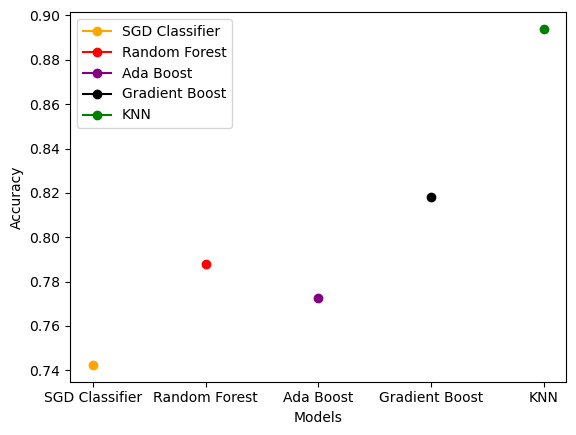

In [135]:
plt.plot(result_with_class_balance[0][0],result_with_class_balance[0][1],'b-o',label=result_with_class_balance[0][0],color='orange')
plt.plot(result_with_class_balance[1][0],result_with_class_balance[1][1],'b-o',label=result_with_class_balance[1][0],color='red')
plt.plot(result_with_class_balance[2][0],result_with_class_balance[2][1],'b-o',label=result_with_class_balance[2][0],color='purple')
plt.plot(result_with_class_balance[3][0],result_with_class_balance[3][1],'b-o',label=result_with_class_balance[3][0],color='black')
plt.plot(result_with_class_balance[4][0],result_with_class_balance[4][1],'b-o',label=result_with_class_balance[4][0],color='green')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### *<ins>Loss Comparison using plot</ins>*

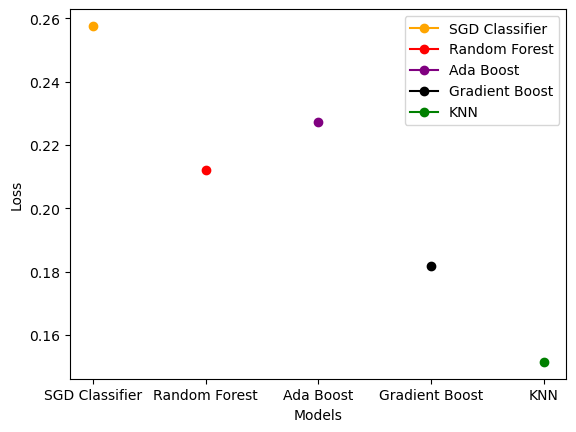

In [136]:
plt.plot(mis_loss_classification_results[0][0],mis_loss_classification_results[0][2],'b-o',label=mis_loss_classification_results[0][0],color='orange')
plt.plot(mis_loss_classification_results[1][0],mis_loss_classification_results[1][2],'b-o',label=mis_loss_classification_results[1][0],color='red')
plt.plot(mis_loss_classification_results[2][0],mis_loss_classification_results[2][2],'b-o',label=mis_loss_classification_results[2][0],color='purple')
plt.plot(mis_loss_classification_results[3][0],mis_loss_classification_results[3][2],'b-o',label=mis_loss_classification_results[3][0],color='black')
plt.plot(mis_loss_classification_results[4][0],mis_loss_classification_results[4][2],'b-o',label=mis_loss_classification_results[4][0],color='green')

plt.xlabel('Models')
plt.ylabel('Loss')
plt.legend()
plt.show()

### From the above evaluation tables, accuracy and loss plots it can be seen that the best performance on the test set comes from "K-Nearest Neighbour" trained on balanced data with best hyperparameters derived from GridSearchCV. It can be seen that the acuracy of "K-Nearest Neighbour" is 0.89, which is the highest, whereas two classifiers SGD and Ada boost  gave the lowest accuracy 0.77 each. The loss value of "K-Nearest Neighbour" is 0.035, which is lowest among other classifiers. Consequently, for this dataset "K-Nearest Neighbour" classifier is best among other classifiers which have been implemented in this project.